In [5]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt

import os
import cv2
import json
import numpy as np
from tqdm import tqdm
from osgeo import gdal
import albumentations as A

In [2]:
def get_style_transform():
    return A.Compose(
        [
            A.OneOf([
                A.RandomFog(fog_coef_lower=0.1, fog_coef_upper=0.5, alpha_coef=0.08, always_apply=True),
                A.RandomShadow(num_shadows_lower=1, num_shadows_upper=3, shadow_dimension=5, always_apply=True),
            ], p=0.3),
            A.OneOf([
                A.Blur(blur_limit=5, always_apply=True),
                A.GaussianBlur(blur_limit=(3, 5), always_apply=True),
                A.Defocus(radius=(3, 6), always_apply=True),
                A.MedianBlur(blur_limit=5, always_apply=True)
            ], p=0.5),
            A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2, p=0.3),
            A.ToGray(p=0.2),
        ]
    )


def get_train_transform():
    return A.Compose(
        [
            # A.OneOf([
            #     A.HorizontalFlip(True),
            #     A.VerticalFlip(True),
            #     A.RandomRotate90(True),
            # ], p=0.75),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
            # A.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.15, hue=0.15, p=0.3),
            A.RandomResizedCrop(512, 512, scale=(0.9, 1.5), ratio=(0.75, 1.333), always_apply=True),
            # RandomDiscreteScale([0.75, 1.25, 1.5], p=0.5),
            # A.RandomCrop(512, 512, True),
        ],
        additional_targets={'image2': 'image', 'mask2': 'mask'}
    )

In [ ]:
def display_image_grid(images_filenames, images_directory, masks_directory, predicted_masks=None):
    cols = 3 if predicted_masks else 2
    rows = len(images_filenames)
    figure, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(10, 24))
    for i, image_filename in enumerate(images_filenames):
        image = cv2.imread(os.path.join(images_directory, image_filename))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(os.path.join(masks_directory, image_filename.replace(".jpg", ".png")), cv2.IMREAD_UNCHANGED,)
        mask = preprocess_mask(mask)
        ax[i, 0].imshow(image)
        ax[i, 1].imshow(mask, interpolation="nearest")

        ax[i, 0].set_title("Image")
        ax[i, 1].set_title("Ground truth mask")

        ax[i, 0].set_axis_off()
        ax[i, 1].set_axis_off()

        if predicted_masks:
            predicted_mask = predicted_masks[i]
            ax[i, 2].imshow(predicted_mask, interpolation="nearest")
            ax[i, 2].set_title("Predicted mask")
            ax[i, 2].set_axis_off()
    plt.tight_layout()
    plt.show()

In [67]:
def plot(t1, t2, m1, m2, tf, repeat=1):
    figure, ax = plt.subplots(nrows=repeat+1, ncols=4, figsize=(16, 4*(repeat+1)))
    ax[0, 0].imshow(t1)
    ax[0, 0].set_axis_off()
    ax[0, 1].imshow(m1)
    ax[0, 1].set_axis_off()
    ax[0, 2].imshow(t2)
    ax[0, 2].set_axis_off()
    ax[0, 3].imshow(m2)
    ax[0, 2].set_axis_off()
    for i in range(1, repeat+1):
        ted = T(image=t1, image2=t2, mask=m1, mask2=m2)
        _t1, _t2, _m1, _m2 = ted['image'], ted['image2'], ted['mask'], ted['mask2']
        ax[i, 0].imshow(_t1)
        ax[i, 0].set_axis_off()
        ax[i, 1].imshow(_m1)
        ax[i, 1].set_axis_off()
        ax[i, 2].imshow(_t2)
        ax[i, 2].set_axis_off()
        ax[i, 3].imshow(_m2)
        ax[i, 3].set_axis_off()
    plt.tight_layout()
    plt.show()
    

In [68]:
img1p = 'E:\\Jiang\\changedetection\\datasets\\S2Looking\\train\\Image1\\29.png'
img2p = 'E:\\Jiang\\changedetection\\datasets\\S2Looking\\train\\Image2\\29.png'
lab1p = 'E:\\Jiang\\changedetection\\datasets\\S2Looking\\train\\label1\\29.png'
lab2p = 'E:\\Jiang\\changedetection\\datasets\\S2Looking\\train\\label2\\29.png'

In [69]:
img1 = cv2.resize(cv2.imread(img1p), (512, 512))
img2 = cv2.resize(cv2.imread(img2p), (512, 512))
lab1 = cv2.resize(cv2.imread(lab1p), (512, 512))
lab2 = cv2.resize(cv2.imread(lab2p), (512, 512))

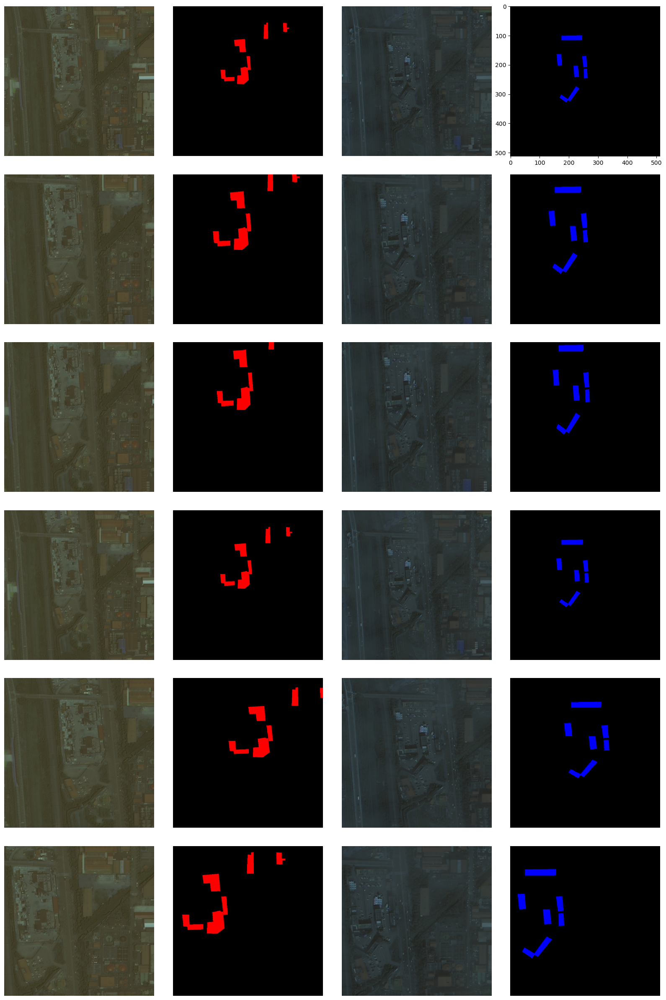

In [71]:
T = A.Compose(
        [
            # A.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.15, hue=0.15, p=0.3),
            A.RandomResizedCrop(512, 512, scale=(0.5, 1.0), ratio=(0.75, 1.333), always_apply=True),
        ],
        additional_targets={'image2': 'image', 'mask2': 'mask'}
    )
plot(img1, img2, lab1, lab2, T, repeat=5)

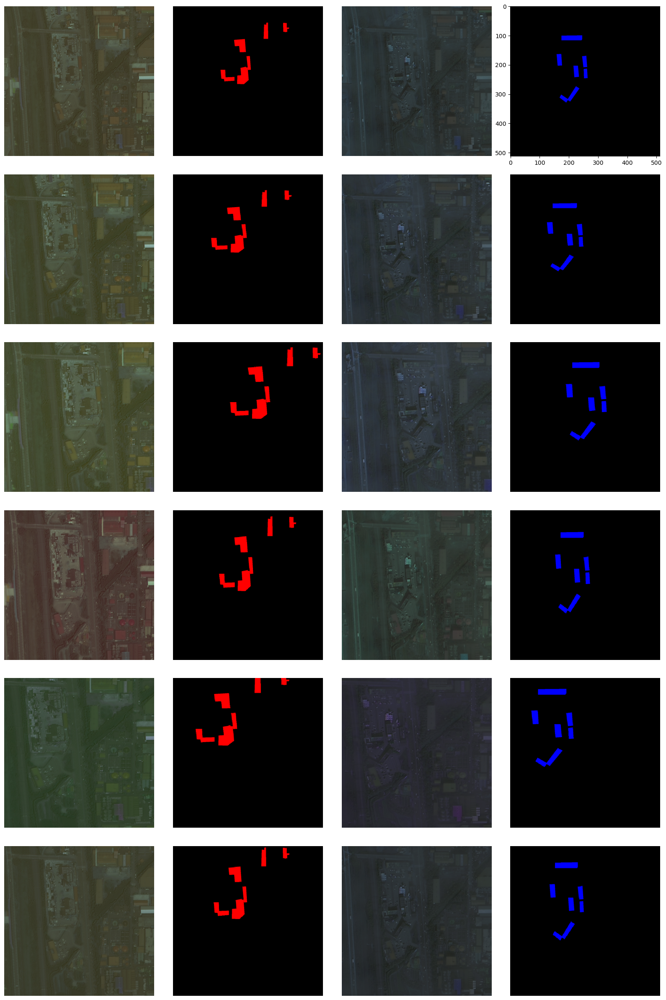

In [74]:
T = A.Compose(
        [
            A.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.15, hue=0.15, always_apply=True),
            A.RandomResizedCrop(512, 512, scale=(0.5, 1.0), ratio=(0.75, 1.333), always_apply=True),
#             A.ToGray(p=0.2),
        ],
        additional_targets={'image2': 'image', 'mask2': 'mask'}
    )
plot(img1, img2, lab1, lab2, T, repeat=5)

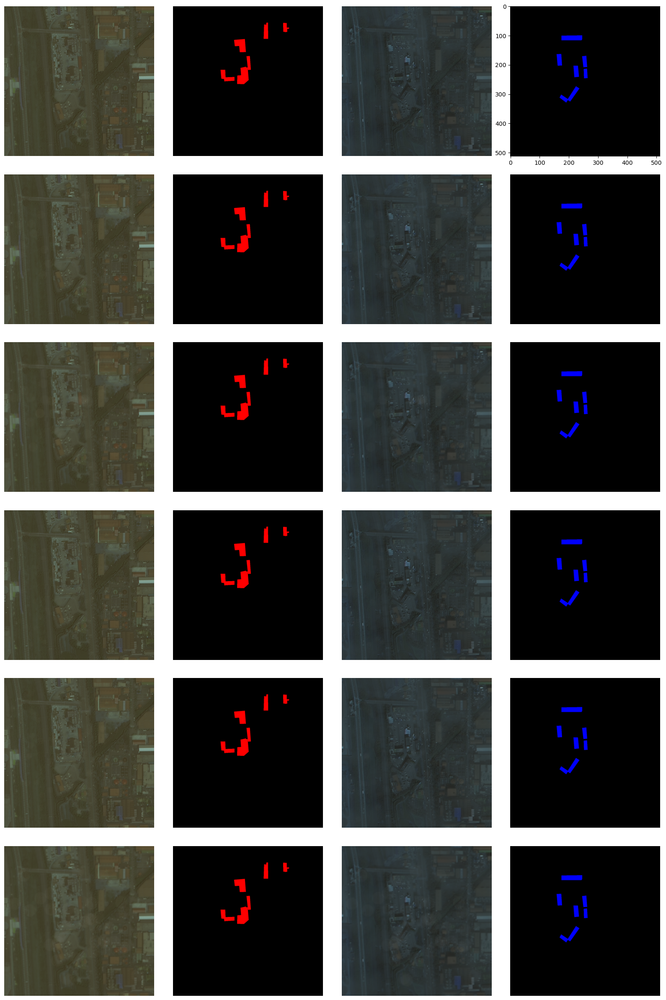

In [86]:
T = A.Compose(
        [
            A.OneOf([
                A.RandomFog(fog_coef_lower=0.1, fog_coef_upper=0.3, alpha_coef=0.08, always_apply=True),
#                 A.RandomShadow(num_shadows_lower=1, num_shadows_upper=3, shadow_dimension=5, always_apply=True),
            ], p=1)
        ],
        additional_targets={'image2': 'image', 'mask2': 'mask'}
    )
plot(img1, img2, lab1, lab2, T, repeat=5)

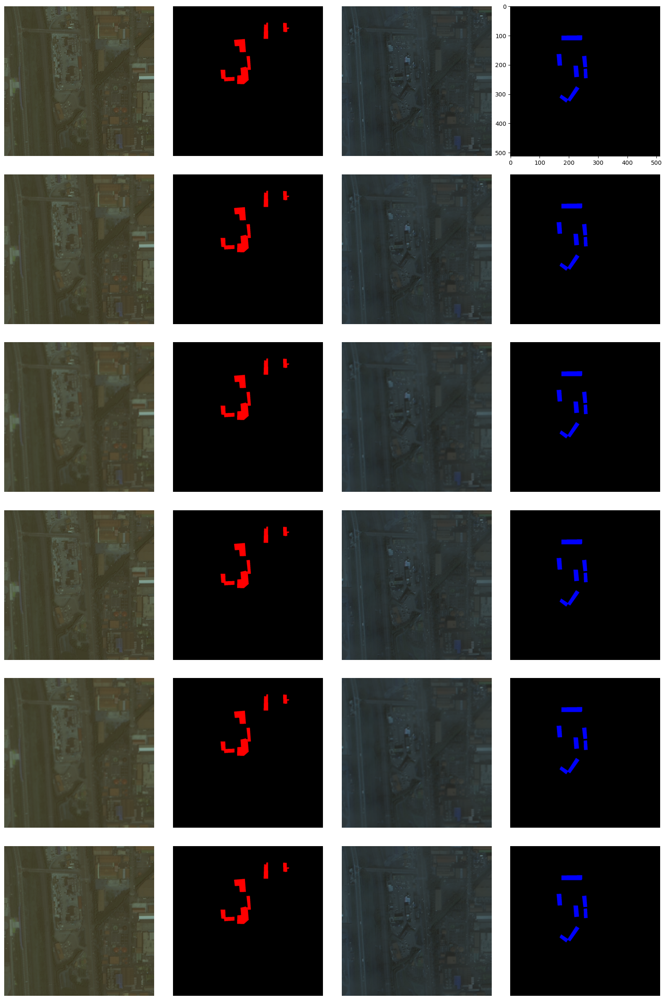

In [88]:
T = A.Compose(
        [
            A.Blur(blur_limit=5, always_apply=True),
#             A.GaussianBlur(blur_limit=(3, 5), always_apply=True),
#             A.Defocus(radius=(3, 6), always_apply=True),
#             A.MedianBlur(blur_limit=5, always_apply=True)

        ],
        additional_targets={'image2': 'image', 'mask2': 'mask'}
    )
plot(img1, img2, lab1, lab2, T, repeat=5)

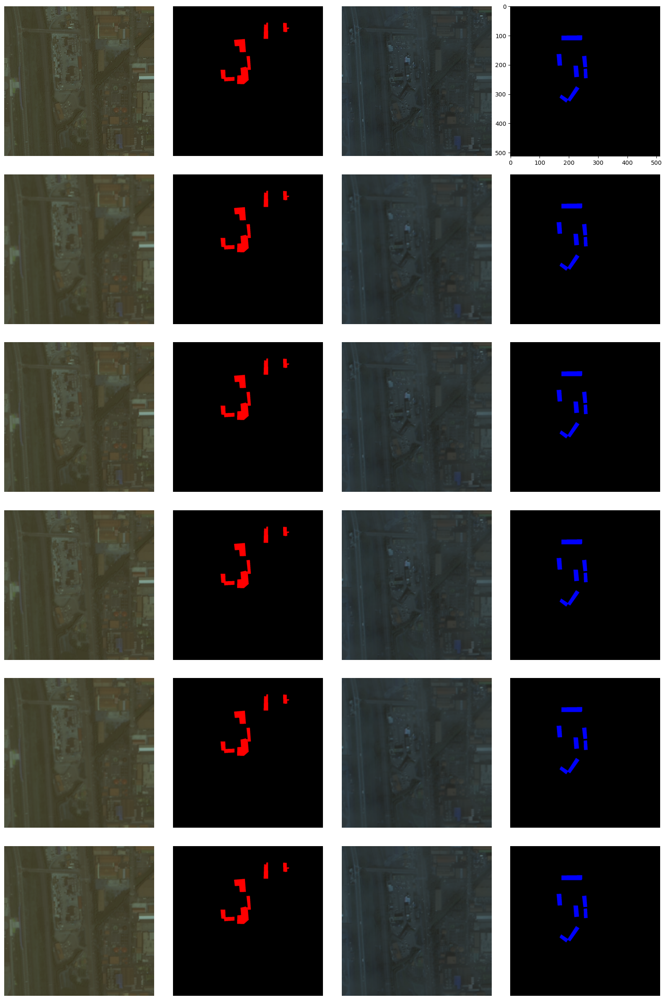

In [92]:
T = A.Compose(
        [
#             A.Blur(blur_limit=5, always_apply=True),
            A.GaussianBlur(blur_limit=(3, 9), always_apply=True),
#             A.Defocus(radius=(3, 6), always_apply=True),
#             A.MedianBlur(blur_limit=5, always_apply=True)

        ],
        additional_targets={'image2': 'image', 'mask2': 'mask'}
    )
plot(img1, img2, lab1, lab2, T, repeat=5)

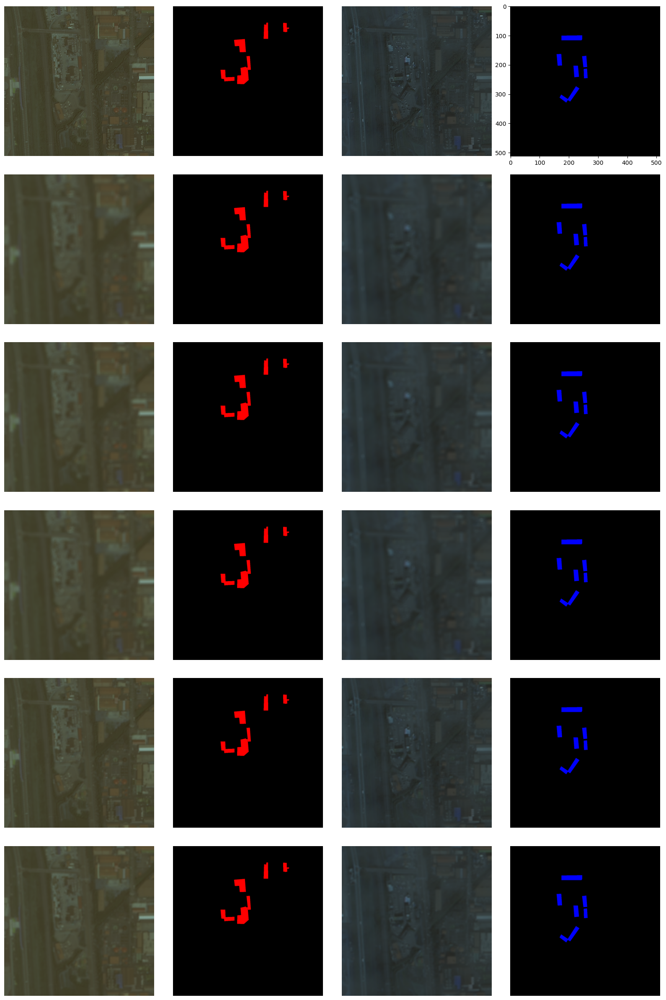

In [96]:
T = A.Compose(
        [
#             A.Blur(blur_limit=5, always_apply=True),
#             A.GaussianBlur(blur_limit=(3, 9), always_apply=True),
            A.Defocus(radius=(2, 14), always_apply=True),
#             A.MedianBlur(blur_limit=5, always_apply=True)

        ],
        additional_targets={'image2': 'image', 'mask2': 'mask'}
    )
plot(img1, img2, lab1, lab2, T, repeat=5)

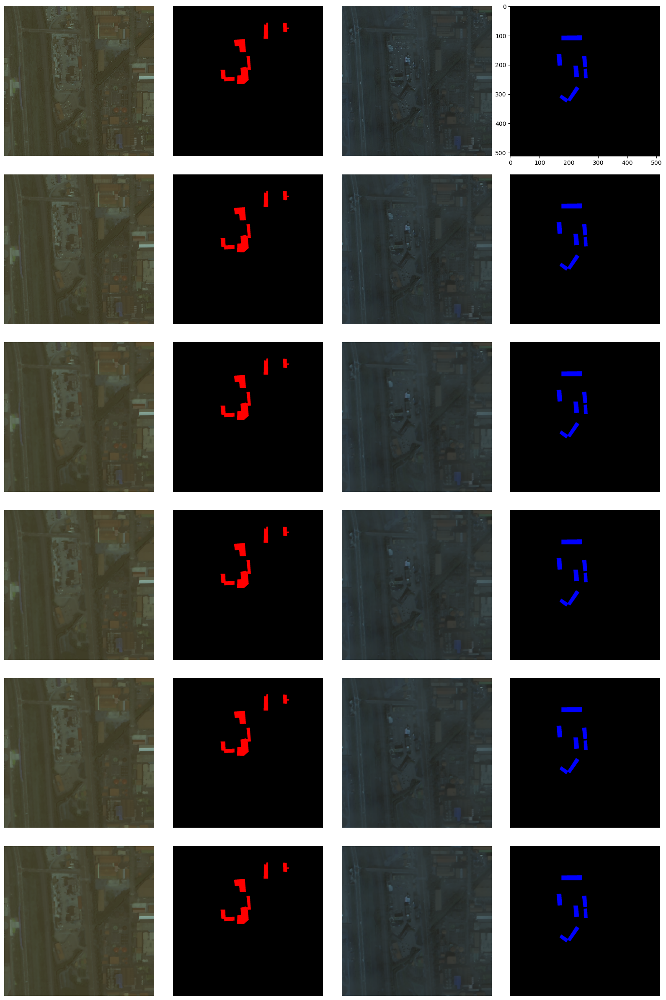

In [101]:
T = A.Compose(
        [
#             A.Blur(blur_limit=5, always_apply=True),
#             A.GaussianBlur(blur_limit=(3, 9), always_apply=True),
#             A.Defocus(radius=(2, 4), always_apply=True),
            A.MedianBlur(blur_limit=5, always_apply=True)

        ],
        additional_targets={'image2': 'image', 'mask2': 'mask'}
    )
plot(img1, img2, lab1, lab2, T, repeat=5)